[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/qubvel/segmentation_models.pytorch/blob/main/examples/binary_segmentation_intro.ipynb)

🇭 🇪 🇱 🇱 🇴 👋

This example shows how to use `segmentation-models-pytorch` for **binary** semantic segmentation. We will use the [The Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/) (this is an adopted example from Albumentations package [docs](https://albumentations.ai/docs/examples/pytorch_semantic_segmentation/), which is strongly recommended to read, especially if you never used this package for augmentations before).

The task will be to classify each pixel of an input image either as pet 🐶🐱 or as a background.


What we are going to overview in this example:  

 - 📜 `Datasets` and `DataLoaders` preparation (with predefined dataset class).  
 - 📦 `LightningModule` preparation: defining training, validation and test routines.  
 - 📈 Writing `IoU` metric inside the `LightningModule` for measuring quality of segmentation.  
 - 🐶 Results visualization.


> It is expected you are familiar with Python, PyTorch and have some experience with training neural networks before!

In [40]:
import os

import torch
import matplotlib.pyplot as plt
import pytorch_lightning as pl
from torch.optim import lr_scheduler
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader

## Dataset

In this example we will use predefined `Dataset` class for simplicity. The dataset actually read pairs of images and masks from disk and return `sample` - dictionary with keys `image`, `mask` and others (not relevant for this example).

⚠️ **Dataset preparation checklist** ⚠️

In case you writing your own dataset, please, make sure that:

1.   **Images** 🖼  
    ✅   Images from dataset have **the same size**, required for packing images to a batch.  
    ✅   Images height and width are **divisible by 32**. This step is important for segmentation, because almost all models have skip-connections between encoder and decoder and all encoders have 5 downsampling stages (2 ^ 5 = 32). Very likely you will face with error when model will try to concatenate encoder and decoder features if height or width is not divisible by 32.  
    ✅   Images have **correct axes order**. PyTorch works with CHW order, we read images in HWC [height, width, channels], don`t forget to transpose image.
2.   **Masks** 🔳  
    ✅   Masks have **the same sizes** as images.   
    ✅   Masks have only `0` - background and `1` - target class values (for binary segmentation).  
    ✅   Even if mask don`t have channels, you need it. Convert each mask from **HW to 1HW** format for binary segmentation (expand the first dimension).

Some of these checks are included in LightningModule below during the training.

❗️ And the main rule: your train, validation and test sets are not intersects with each other!

In [41]:
import os
from torch.utils.data import Dataset
from PIL import Image
from torchvision import transforms

class CustomImageMaskDataset(Dataset):
    def __init__(self, root, split="train", transform=None, target_transform=None):
        self.root = root
        self.image_dir = os.path.join(root, "images")
        self.label_dir = os.path.join(root, "labels")
        self.transform = transform
        self.target_transform = target_transform

        self.filenames = sorted(os.listdir(self.image_dir))
        total_len = len(self.filenames)
        train_end = int(0.7 * total_len)
        valid_end = int(0.85 * total_len)

        if split == "train":
            self.filenames = self.filenames[:train_end]
        elif split == "valid":
            self.filenames = self.filenames[train_end:valid_end]
        elif split == "test":
            self.filenames = self.filenames[valid_end:]
        else:
            raise ValueError("Invalid split: choose from 'train', 'valid', or 'test'")

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
      image_name = self.filenames[idx]
      image_path = os.path.join(self.image_dir, image_name)

      # Replace extension to .png for label
      label_name = os.path.splitext(image_name)[0] + ".png"
      label_path = os.path.join(self.label_dir, label_name)

      image = Image.open(image_path).convert("RGB")
      label = Image.open(label_path).convert("L")

      if self.transform:
          image = self.transform(image)
      if self.target_transform:
          label = self.target_transform(label)

      return image, label



In [42]:
from torch.utils.data import DataLoader
import torchvision.transforms as T
import os

root = "Dataset/"
n_cpu = os.cpu_count()

transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor()
])

target_transform = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor()
])

train_dataset = CustomImageMaskDataset(root, "train", transform, target_transform)
valid_dataset = CustomImageMaskDataset(root, "valid", transform, target_transform)
test_dataset = CustomImageMaskDataset(root, "test", transform, target_transform)

assert set(test_dataset.filenames).isdisjoint(set(train_dataset.filenames))
assert set(test_dataset.filenames).isdisjoint(set(valid_dataset.filenames))
assert set(train_dataset.filenames).isdisjoint(set(valid_dataset.filenames))

print(f"Train size: {len(train_dataset)}")
print(f"Valid size: {len(valid_dataset)}")
print(f"Test size: {len(test_dataset)}")

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
valid_dataloader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=2)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=2)


Train size: 391
Valid size: 84
Test size: 84


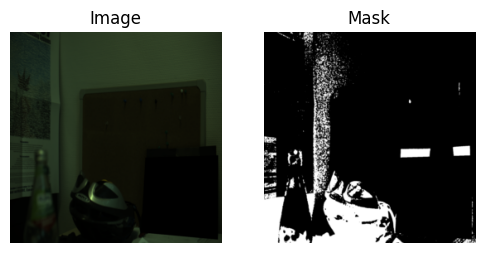

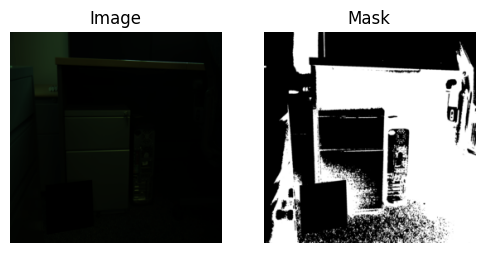

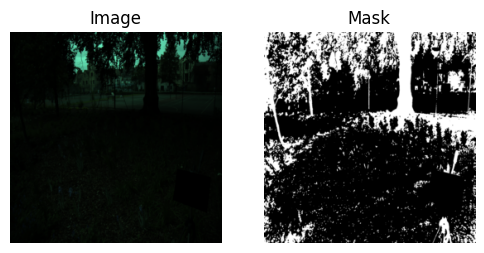

In [43]:
import matplotlib.pyplot as plt
import torch

# Helper function to visualize image and mask
def show_sample(dataset, index):
    image, mask = dataset[index]  # returns a tuple
    image = image.permute(1, 2, 0)  # CxHxW → HxWxC
    mask = mask.squeeze()  # 1xHxW → HxW

    plt.figure(figsize=(6, 3))
    plt.subplot(1, 2, 1)
    plt.title("Image")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Mask")
    plt.imshow(mask, cmap="gray")
    plt.axis("off")

    plt.show()

# Visualize one sample each from train, valid, test
show_sample(train_dataset, 0)
show_sample(valid_dataset, 0)
show_sample(test_dataset, 0)


## Model

In [44]:
# Some training hyperparameters
EPOCHS = 30
T_MAX = EPOCHS * len(train_dataloader)
OUT_CLASSES = 1

In [45]:
class GrayModel(pl.LightningModule):
    def __init__(self, arch, encoder_name, in_channels, out_classes, **kwargs):
        super().__init__()
        self.model = smp.create_model(
            arch,
            encoder_name=encoder_name,
            in_channels=in_channels,
            classes=out_classes,
            **kwargs,
        )
        # preprocessing parameters for image
        params = smp.encoders.get_preprocessing_params(encoder_name)
        self.register_buffer("std", torch.tensor(params["std"]).view(1, 3, 1, 1))
        self.register_buffer("mean", torch.tensor(params["mean"]).view(1, 3, 1, 1))

        # for image segmentation dice loss could be the best first choice
        self.loss_fn = smp.losses.DiceLoss(smp.losses.BINARY_MODE, from_logits=True)

        # initialize step metrics
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

    def forward(self, image):
        # normalize image here
        image = (image - self.mean) / self.std
        mask = self.model(image)
        return mask

    def shared_step(self, batch, stage):
        image, mask = batch  # Unpack the tuple directly

        # Shape of the image should be (batch_size, num_channels, height, width)
        assert image.ndim == 4

        # Check that image dimensions are divisible by 32
        h, w = image.shape[2:]
        assert h % 32 == 0 and w % 32 == 0

        assert mask.ndim == 4

        # Check that mask values are between 0 and 1
        assert mask.max() <= 1.0 and mask.min() >= 0

        logits_mask = self.forward(image)

        # Predicted mask contains logits, and loss_fn param `from_logits` is set to True
        loss = self.loss_fn(logits_mask, mask)

        # Compute metrics
        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        tp, fp, fn, tn = smp.metrics.get_stats(
            pred_mask.long(), mask.long(), mode="binary"
        )
        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        per_image_iou = smp.metrics.iou_score(
            tp, fp, fn, tn, reduction="micro-imagewise"
        )
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
        metrics = {
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        self.log_dict(metrics, prog_bar=True)

    def training_step(self, batch, batch_idx):
        train_loss_info = self.shared_step(batch, "train")
        self.training_step_outputs.append(train_loss_info)
        return train_loss_info

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()

    def validation_step(self, batch, batch_idx):
        valid_loss_info = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(valid_loss_info)
        return valid_loss_info

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()

    def test_step(self, batch, batch_idx):
        test_loss_info = self.shared_step(batch, "test")
        self.test_step_outputs.append(test_loss_info)
        return test_loss_info

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=2e-4)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=T_MAX, eta_min=1e-5)
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "interval": "step",
                "frequency": 1,
            },
        }

In [46]:
model = GrayModel("FPN", "resnet34", in_channels=3, out_classes=1)

## Training

In [47]:
trainer = pl.Trainer(max_epochs=EPOCHS, log_every_n_steps=1)

trainer.fit(
    model,
    train_dataloaders=train_dataloader,
    val_dataloaders=valid_dataloader,
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | FPN      | 23.2 M | train
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
23.2 M    Trainable params
0         Non-trainable params
23.2 M    Total params
92.622    Total estimated model params size (MB)
175       Modules in train mode
0         Modules in eval mode


Epoch 29: 100%|██████████| 7/7 [00:29<00:00,  0.24it/s, v_num=3, valid_per_image_iou=0.306, valid_dataset_iou=0.320, train_per_image_iou=0.482, train_dataset_iou=0.573]

`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 29: 100%|██████████| 7/7 [00:30<00:00,  0.23it/s, v_num=3, valid_per_image_iou=0.306, valid_dataset_iou=0.320, train_per_image_iou=0.482, train_dataset_iou=0.573]


## Validation and test metrics

In [48]:
# run validation dataset
valid_metrics = trainer.validate(model, dataloaders=valid_dataloader, verbose=False)
print(valid_metrics)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s]
[{'valid_per_image_iou': 0.30611202120780945, 'valid_dataset_iou': 0.3200801908969879}]


In [49]:
# run test dataset
test_metrics = trainer.test(model, dataloaders=test_dataloader, verbose=False)
print(test_metrics)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 13.40it/s]
[{'test_per_image_iou': 0.3048514127731323, 'test_dataset_iou': 0.325877845287323}]


# Save model to HF Hub

Login to [HF hub](https://huggingface.co/) if you want to save your model to the hub. Then, you will be able to save and load model, save metrics, and dataset name!

In [50]:
import torch
import matplotlib.pyplot as plt
import os


# Run validation dataset
valid_metrics = trainer.validate(model, dataloaders=valid_dataloader, verbose=False)
print("Validation Metrics:", valid_metrics)

# Run test dataset
test_metrics = trainer.test(model, dataloaders=test_dataloader, verbose=False)
print("Test Metrics:", test_metrics)

# Define path to save the model in Google Drive
save_path = "GrayModel.pth"

# Save the model state dictionary
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")

# Load the model from Google Drive
loaded_model = GrayModel("FPN", "resnet34", in_channels=3, out_classes=1)
loaded_model.load_state_dict(torch.load(save_path))
loaded_model.eval()  # Set to evaluation mode
print("Model loaded from Google Drive")

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation Metrics: [{'valid_per_image_iou': 0.30611202120780945, 'valid_dataset_iou': 0.3200801908969879}]
Testing DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s]
Test Metrics: [{'test_per_image_iou': 0.3048514127731323, 'test_dataset_iou': 0.325877845287323}]
Model saved to GrayModel.pth
Model loaded from Google Drive


# Result visualization

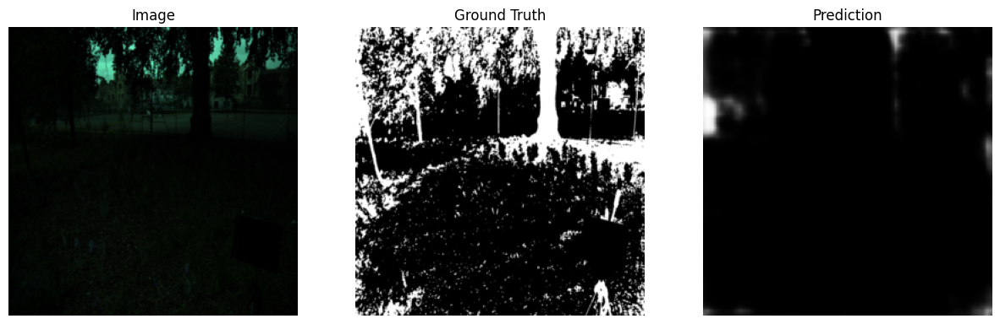

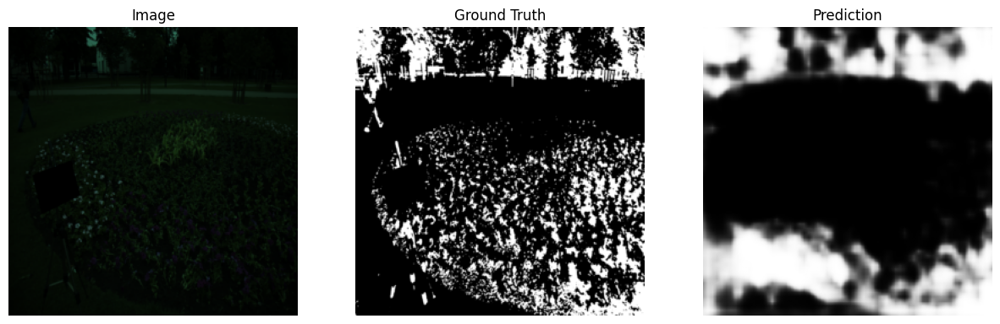

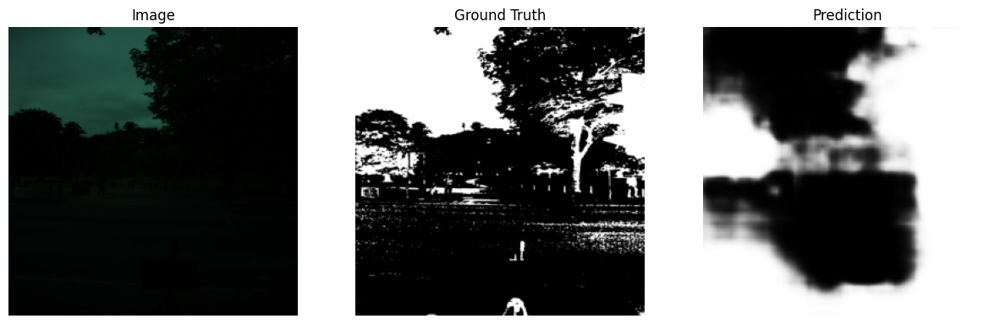

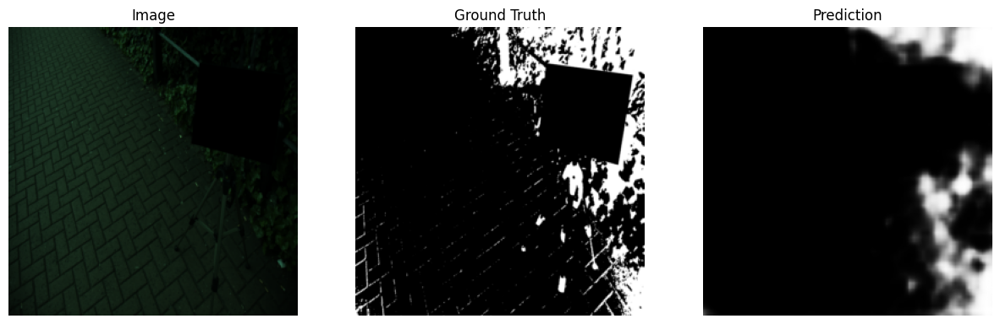

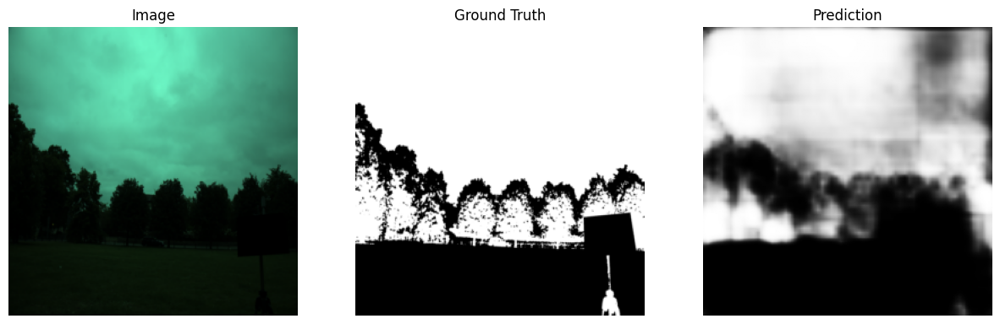

...

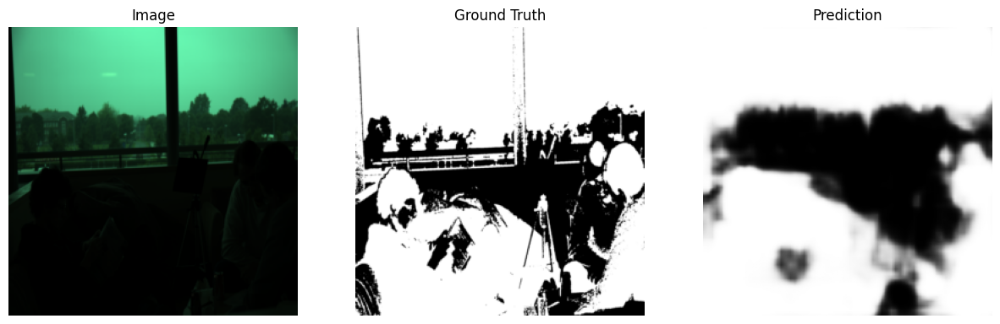

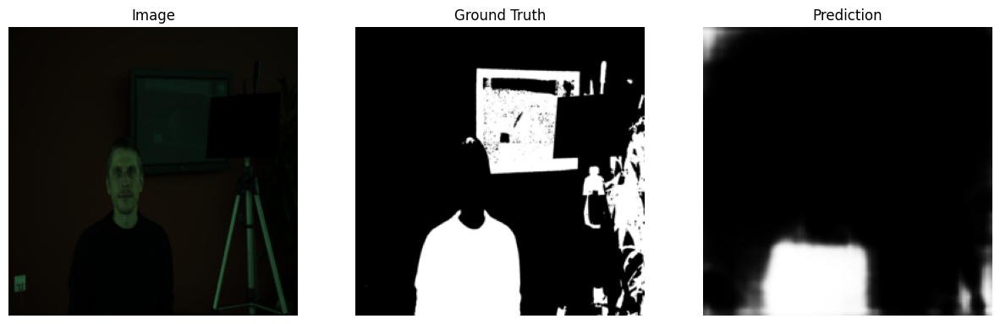

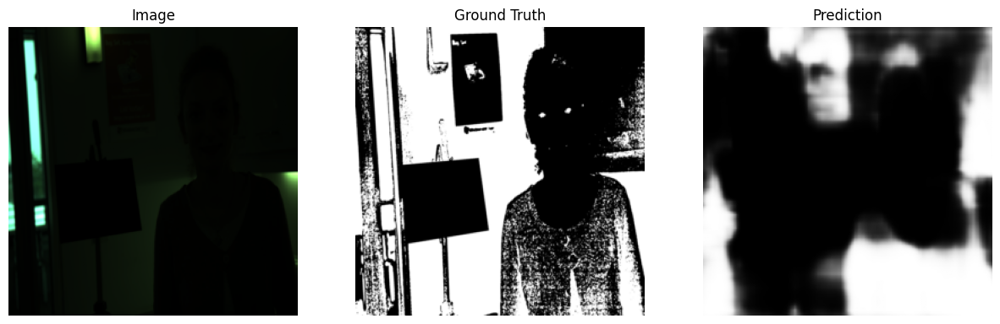

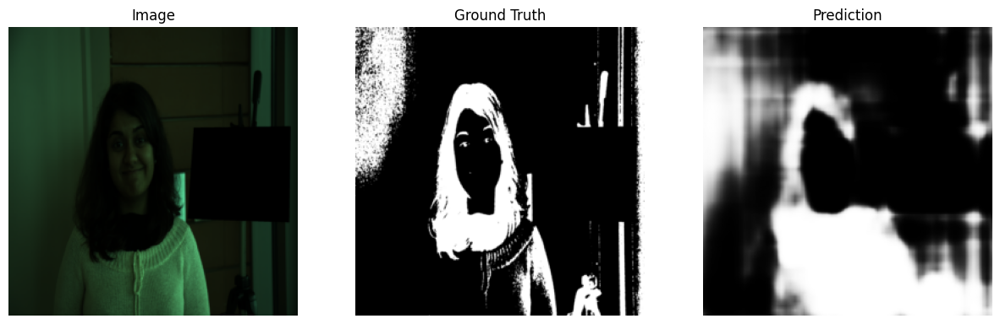

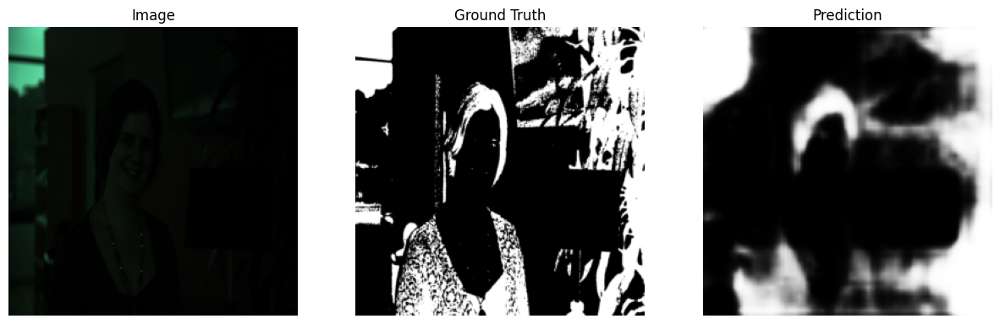

: 

In [ ]:


# Visualize results
batch = next(iter(test_dataloader))
images, gt_masks = batch  # Unpack the tuple (image, mask)

with torch.no_grad():
    logits = loaded_model(images)  # Get predictions
    pr_masks = logits.sigmoid()  # Convert logits to probabilities

# Visualize up to 5 samples
for idx, (image, gt_mask, pr_mask) in enumerate(zip(images, gt_masks, pr_masks)):
    if idx >= 100:
        break
    plt.figure(figsize=(15, 5))

    # Image
    plt.subplot(1, 3, 1)
    plt.imshow(image.permute(1, 2, 0).numpy())  # CxHxW -> HxWxC
    plt.title("Image")
    plt.axis("off")

    # Ground truth mask
    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.squeeze().numpy(), cmap="gray")  # Remove channel dim
    plt.title("Ground Truth")
    plt.axis("off")

    # Predicted mask
    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.squeeze().numpy(), cmap="gray")  # Remove channel dim
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

In [ ]:
import os
os._exit(00)